In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.efficientnet import preprocess_input

from sklearn.metrics import confusion_matrix
from sklearn.metrics import cohen_kappa_score
from sklearn.utils.class_weight import compute_class_weight

# --------------------------
# CONFIG
# --------------------------
SEED = 42
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

CKPT_DIR = "/content/drive/MyDrive/Image Processing Project/checkpoints"
os.makedirs(CKPT_DIR, exist_ok=True)

# --------------------------
# 1) GENERATORS
# --------------------------
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=10,
    horizontal_flip=True
)

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

train_gen = train_datagen.flow_from_dataframe(
    df_train_small,
    directory=PREP_TRAIN_DIR,
    x_col="id_code",
    y_col="diagnosis",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=True,
    seed=SEED
)

# class mapping
CLASS_NAMES = list(train_gen.class_indices.keys())

val_gen = val_datagen.flow_from_dataframe(
    df_val_small,
    directory=PREP_VAL_DIR,
    x_col="id_code",
    y_col="diagnosis",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False,
    classes=CLASS_NAMES
)

num_classes = len(CLASS_NAMES)
print("Class indices:", train_gen.class_indices)

# --------------------------
# 2) CLASS WEIGHTS
# --------------------------
labels = df_train_small["diagnosis"].astype(str).values
cw_vals = compute_class_weight(
    class_weight="balanced",
    classes=np.array(CLASS_NAMES),
    y=labels
)

class_weights = {
    train_gen.class_indices[k]: float(w)
    for k, w in zip(CLASS_NAMES, cw_vals)
}

print("Class weights:", class_weights)

# --------------------------
# 3) METRICS
# --------------------------
metrics = [
    keras.metrics.CategoricalAccuracy(name="acc"),
    keras.metrics.TopKCategoricalAccuracy(k=2, name="top2_acc"),
    keras.metrics.AUC(name="auc", multi_label=True, num_labels=num_classes),
]

# --------------------------
# 4) MODEL
# --------------------------
base = keras.applications.EfficientNetB0(
    include_top=False,
    weights="imagenet",
    input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3)
)

inputs = keras.Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 3))
x = base(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(num_classes, activation="softmax")(x)
model = keras.Model(inputs, outputs)

# --------------------------
# 5) CALLBACKS
# --------------------------
class EpochPercentLogger(keras.callbacks.Callback):
    def __init__(self, total_epochs):
        super().__init__()
        self.total_epochs = total_epochs
    def on_epoch_begin(self, epoch, logs=None):
        pct = (epoch / self.total_epochs) * 100.0
        print(f"\n📌 Epoch progress: {epoch+1}/{self.total_epochs} ({pct:.1f}%)")

class QWKCallback(keras.callbacks.Callback):
    def __init__(self, val_gen):
        super().__init__()
        self.val_gen = val_gen
    def on_epoch_end(self, epoch, logs=None):
        y_true = self.val_gen.classes
        y_pred = np.argmax(self.model.predict(self.val_gen, verbose=0), axis=1)
        qwk = cohen_kappa_score(y_true, y_pred, weights="quadratic")
        print(f"QWK (val): {qwk:.4f}")

# save the best model
best_ckpt = keras.callbacks.ModelCheckpoint(
    filepath=os.path.join(CKPT_DIR, "best_model.keras"),
    monitor="val_loss",
    save_best_only=True,
    verbose=1
)

# save each epoch model
epoch_ckpt = keras.callbacks.ModelCheckpoint(
    filepath=os.path.join(CKPT_DIR, "epoch_{epoch:02d}_valLoss_{val_loss:.4f}.keras"),
    save_best_only=False,
    verbose=0
)

common_cbs = [
    best_ckpt,
    epoch_ckpt,
    keras.callbacks.ReduceLROnPlateau(patience=1, factor=0.5, verbose=1),
    keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True, verbose=1),
    QWKCallback(val_gen)
]

# --------------------------
# 6) WARMUP
# --------------------------
warmup_epochs = 3
base.trainable = False

model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss="categorical_crossentropy",
    metrics=metrics
)

print("\n=== WARMUP (base frozen) ===")
model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=warmup_epochs,
    class_weight=class_weights,
    callbacks=[EpochPercentLogger(warmup_epochs)] + common_cbs,
    verbose=1
)

# --------------------------
# 7) FINE-TUNE
# --------------------------
fine_tune_epochs = 10
base.trainable = True

model.compile(
    optimizer=keras.optimizers.Adam(1e-4),
    loss="categorical_crossentropy",
    metrics=metrics
)

print("\n=== FINE-TUNE (base trainable=True) ===")
model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=fine_tune_epochs,
    class_weight=class_weights,
    callbacks=[EpochPercentLogger(fine_tune_epochs)] + common_cbs,
    verbose=1
)

# --------------------------
# 8) FINAL EVALUATION
# --------------------------
y_true = val_gen.classes
y_pred = np.argmax(model.predict(val_gen, verbose=0), axis=1)

final_qwk = cohen_kappa_score(y_true, y_pred, weights="quadratic")
cm = confusion_matrix(y_true, y_pred)

print("\nFINAL QWK:", round(final_qwk, 4))
print("Prediction distribution:", np.bincount(y_pred, minlength=num_classes))
print("Confusion Matrix:\n", cm)


In [ ]:
from google.colab import drive
drive.mount("/content/drive")

import os, glob

SEARCH_ROOT = "/content/drive/MyDrive"

def pick_one(patterns):
    hits = []
    for p in patterns:
        hits += glob.glob(os.path.join(SEARCH_ROOT, "**", p), recursive=True)

    hits = sorted(list(set(hits)), key=len)
    return hits[0] if hits else None, hits[:10]

train_csv, train_hits = pick_one(["train_1.csv","train.csv"])
val_csv,   val_hits   = pick_one(["valid.csv","val.csv","validation.csv"])
test_csv,  test_hits  = pick_one(["test.csv"])

print("TRAIN candidates:", *train_hits[:5], sep="\n - ")
print("\nVAL candidates:", *val_hits[:5], sep="\n - ")
print("\nTEST candidates:", *test_hits[:5], sep="\n - ")

assert train_csv is not None, "train CSV bulunamadı (train_1.csv / train.csv yok)."
assert val_csv   is not None, "valid/val CSV bulunamadı (valid.csv / val.csv / validation.csv yok)."

TRAIN_CSV = train_csv
VAL_CSV   = val_csv
TEST_CSV  = test_csv

BASE_DRIVE = os.path.dirname(TRAIN_CSV)
print("\nSelected paths:")
print("TRAIN_CSV:", TRAIN_CSV)
print("VAL_CSV  :", VAL_CSV)
print("TEST_CSV :", TEST_CSV)
print("BASE_DRIVE:", BASE_DRIVE)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
TRAIN candidates:
 - /content/drive/MyDrive/Image Processing Project/train_1.csv

VAL candidates:
 - /content/drive/MyDrive/Image Processing Project/valid.csv

TEST candidates:
 - /content/drive/MyDrive/Image Processing Project/test.csv

Selected paths:
TRAIN_CSV: /content/drive/MyDrive/Image Processing Project/train_1.csv
VAL_CSV  : /content/drive/MyDrive/Image Processing Project/valid.csv
TEST_CSV : /content/drive/MyDrive/Image Processing Project/test.csv
BASE_DRIVE: /content/drive/MyDrive/Image Processing Project


In [ ]:
import os, glob, warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import cv2
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm import tqdm

# ---- CONFIG ----
SEED = 42
WORKERS = 8
OUT_SIZE = (224, 224)

# CSV paths
TRAIN_CSV = "/content/drive/MyDrive/Image Processing Project/train_1.csv"
VAL_CSV   = "/content/drive/MyDrive/Image Processing Project/valid.csv"
TEST_CSV  = "/content/drive/MyDrive/Image Processing Project/test.csv"  # opsiyonel

# Preprocessed output:
PREP_ROOT = "/content/preprocessed_aptos"
PREP_TRAIN_DIR = os.path.join(PREP_ROOT, "train_images")
PREP_VAL_DIR   = os.path.join(PREP_ROOT, "val_images")
PREP_TEST_DIR  = os.path.join(PREP_ROOT, "test_images")

try:
    cv2.setNumThreads(0)
except:
    pass

IMAGE_EXT = (".png", ".jpg", ".jpeg", ".PNG", ".JPG", ".JPEG")

def pick_image_ext_from_disk():

    for ext in (".png",".jpg",".jpeg",".PNG",".JPG",".JPEG"):
        if glob.glob(f"/content/**/*{ext}", recursive=True) or glob.glob(f"/content/drive/**/*{ext}", recursive=True):
            return ext.lower()
    return ".png"  # fallback

def ensure_ext(series, ext):
    s = series.astype(str)
    def _fix(x):
        xl = x.lower()
        if xl.endswith((".png",".jpg",".jpeg")):
            return x
        return x + ext
    return s.apply(_fix)

def find_dir_by_csv(df, roots, sample_n=200):
    names = df["id_code"].astype(str).tolist()
    if len(names) > sample_n:
        rng = np.random.default_rng(SEED)
        names = list(rng.choice(names, size=sample_n, replace=False))

    scores = {}
    for name in tqdm(names, desc="Searching folders by CSV filenames"):

        for r in roots:
            hits = glob.glob(os.path.join(r, "**", name), recursive=True)
            for h in hits:
                d = os.path.dirname(h)
                scores[d] = scores.get(d, 0) + 1

    if not scores:
        return None, 0, None

    best_dir, best_hits = max(scores.items(), key=lambda x: x[1])
    # uzantıyı da best_dir içinden yakala
    any_file = glob.glob(os.path.join(best_dir, "*"))
    ext = os.path.splitext(any_file[0])[1].lower() if any_file else None
    return best_dir, best_hits, ext

def crop_black_borders(img_bgr, tol=10):
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    mask = gray > tol
    if mask.sum() == 0:
        return img_bgr
    coords = np.argwhere(mask)
    y0, x0 = coords.min(axis=0)
    y1, x1 = coords.max(axis=0) + 1
    return img_bgr[y0:y1, x0:x1]

def align_by_centroid(img_bgr, tol=10):
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    mask = (gray > tol).astype(np.uint8)
    M = cv2.moments(mask)
    if M["m00"] == 0:
        return img_bgr
    cx = int(M["m10"]/M["m00"]); cy = int(M["m01"]/M["m00"])
    h, w = img_bgr.shape[:2]
    tx = (w//2) - cx; ty = (h//2) - cy
    mat = np.float32([[1,0,tx],[0,1,ty]])
    return cv2.warpAffine(img_bgr, mat, (w,h), flags=cv2.INTER_LINEAR,
                          borderMode=cv2.BORDER_CONSTANT, borderValue=(0,0,0))

def clahe_green(img_bgr, clip=2.0, grid=(8,8)):
    b,g,r = cv2.split(img_bgr)
    clahe = cv2.createCLAHE(clipLimit=clip, tileGridSize=grid)
    g2 = clahe.apply(g)
    return cv2.merge([b,g2,r])

def preprocess_bgr(img_bgr):
    img_bgr = cv2.GaussianBlur(img_bgr, (3,3), 0)
    img_bgr = crop_black_borders(img_bgr, tol=10)
    img_bgr = align_by_centroid(img_bgr, tol=10)
    img_bgr = clahe_green(img_bgr)
    return img_bgr

def build_preprocessed_dataset(df, src_dir, dst_dir, workers=8, out_size=(224,224), overwrite=False):
    os.makedirs(dst_dir, exist_ok=True)
    files = df["id_code"].astype(str).tolist()

    def _one(fname):
        src = os.path.join(src_dir, fname)
        dst = os.path.join(dst_dir, fname)
        if (not overwrite) and os.path.exists(dst):
            return "skipped"
        img = cv2.imread(src)
        if img is None:
            return "missing"
        img = preprocess_bgr(img)
        img = cv2.resize(img, out_size, interpolation=cv2.INTER_AREA)
        ok = cv2.imwrite(dst, img)
        return "ok" if ok else "failed"

    stats = {"ok":0, "skipped":0, "missing":0, "failed":0}
    with ThreadPoolExecutor(max_workers=workers) as ex:
        futs = [ex.submit(_one, f) for f in files]
        for fu in tqdm(as_completed(futs), total=len(futs), desc=f"Preprocess -> {os.path.basename(dst_dir)}"):
            stats[fu.result()] += 1
    print(f"Done {dst_dir} | {stats}")
    return stats

# -----------------------------
# 1) CSV
# -----------------------------
assert os.path.exists(TRAIN_CSV) and os.path.exists(VAL_CSV), "TRAIN/VAL CSV yolu hatalı!"
df_train = pd.read_csv(TRAIN_CSV)
df_val   = pd.read_csv(VAL_CSV)
df_test  = pd.read_csv(TEST_CSV) if os.path.exists(TEST_CSV) else None

# -----------------------------
# 2) IMAGE_EXT + CSV id_code
# -----------------------------
IMAGE_EXT = pick_image_ext_from_disk()
df_train["id_code"] = ensure_ext(df_train["id_code"], IMAGE_EXT)
df_val["id_code"]   = ensure_ext(df_val["id_code"],   IMAGE_EXT)
df_train["diagnosis"] = df_train["diagnosis"].astype(str)
df_val["diagnosis"]   = df_val["diagnosis"].astype(str)
if df_test is not None and "id_code" in df_test.columns:
    df_test["id_code"] = ensure_ext(df_test["id_code"], IMAGE_EXT)

print("Using IMAGE_EXT:", IMAGE_EXT)

# -----------------------------
# 3) open TRAIN/VAL folders using CSV
# -----------------------------
SEARCH_ROOTS = [
    "/content",
    "/content/drive",
]

TRAIN_DIR, train_hits, _ = find_dir_by_csv(df_train, SEARCH_ROOTS, sample_n=250)
VAL_DIR,   val_hits,   _ = find_dir_by_csv(df_val,   SEARCH_ROOTS, sample_n=250)

print("\nTRAIN_DIR:", TRAIN_DIR, "| sample hits:", train_hits)
print("VAL_DIR  :", VAL_DIR,   "| sample hits:", val_hits)

if not TRAIN_DIR or not VAL_DIR:
    raise AssertionError(
        "CSV'ye göre train/val resim klasörü bulunamadı. "
    )

# TEST
TEST_DIR = None
if df_test is not None and "id_code" in df_test.columns:
    TEST_DIR, test_hits, _ = find_dir_by_csv(df_test, SEARCH_ROOTS, sample_n=200)
    print("TEST_DIR :", TEST_DIR, "| sample hits:", test_hits, "(opsiyonel)")


_ = build_preprocessed_dataset(df_train, TRAIN_DIR, PREP_TRAIN_DIR, workers=WORKERS, out_size=OUT_SIZE, overwrite=False)
_ = build_preprocessed_dataset(df_val,   VAL_DIR,   PREP_VAL_DIR,   workers=WORKERS, out_size=OUT_SIZE, overwrite=False)

if (df_test is not None) and (TEST_DIR is not None):
    _ = build_preprocessed_dataset(df_test, TEST_DIR, PREP_TEST_DIR, workers=WORKERS, out_size=OUT_SIZE, overwrite=False)
else:
    print("TEST preprocessing atlandı.")

print("\nREADY:")
print("PREP_TRAIN_DIR:", PREP_TRAIN_DIR, "count:", len(glob.glob(PREP_TRAIN_DIR+"/*")))
print("PREP_VAL_DIR  :", PREP_VAL_DIR,   "count:", len(glob.glob(PREP_VAL_DIR+"/*")))
print("PREP_TEST_DIR :", PREP_TEST_DIR,  "count:", len(glob.glob(PREP_TEST_DIR+"/*")))
print("Ready vars: df_train, df_val, (df_test), PREP_TRAIN_DIR, PREP_VAL_DIR, PREP_TEST_DIR")


Using IMAGE_EXT: .png


Searching folders by CSV filenames: 100%|██████████| 250/250 [03:01<00:00,  1.37it/s]



TRAIN_DIR: /content/drive/MyDrive/Image Processing Project/train_images/train_images | sample hits: 500
VAL_DIR  : /content/drive/MyDrive/Image Processing Project/val_images/val_images | sample hits: 500


Searching folders by CSV filenames: 100%|██████████| 200/200 [02:23<00:00,  1.39it/s]


TEST_DIR : /content/drive/MyDrive/Image Processing Project/test_images/test_images | sample hits: 400 (opsiyonel)


Preprocess -> train_images: 100%|██████████| 2930/2930 [12:28<00:00,  3.92it/s]


Done /content/preprocessed_aptos/train_images | {'ok': 2930, 'skipped': 0, 'missing': 0, 'failed': 0}


Preprocess -> val_images: 100%|██████████| 366/366 [01:39<00:00,  3.66it/s]


Done /content/preprocessed_aptos/val_images | {'ok': 366, 'skipped': 0, 'missing': 0, 'failed': 0}


Preprocess -> test_images: 100%|██████████| 366/366 [01:30<00:00,  4.06it/s]

Done /content/preprocessed_aptos/test_images | {'ok': 366, 'skipped': 0, 'missing': 0, 'failed': 0}

READY:
PREP_TRAIN_DIR: /content/preprocessed_aptos/train_images count: 2930
PREP_VAL_DIR  : /content/preprocessed_aptos/val_images count: 366
PREP_TEST_DIR : /content/preprocessed_aptos/test_images count: 366
Ready vars: df_train, df_val, (df_test), PREP_TRAIN_DIR, PREP_VAL_DIR, PREP_TEST_DIR


Demo seçimi : 10 görsel (hedef 10).
            id_code diagnosis
0  02358b47ea89.png         0
1  15b21c80cc31.png         0
2  0ad7f631dedb.png         1
3  1a03a7970337.png         1
4  1411c8ab7161.png         2
5  01eb826f6467.png         2
6  03c85870824c.png         3
7  0edadb2aa127.png         3
8  11242a67122d.png         4
9  1638404f385c.png         4


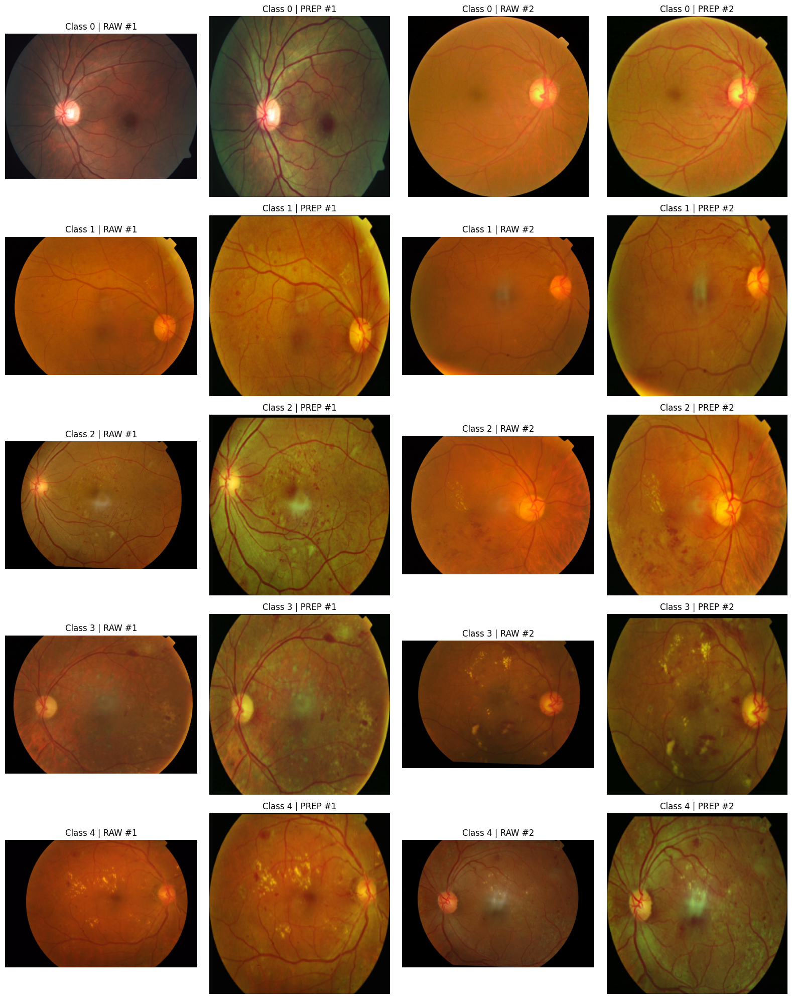

Demo görselleri hazır. (Her class için 2 örnek: RAW vs PREP)


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2

SEED = 42
CLASSES = ["0","1","2","3","4"]      # diagnosis string
N_PER_CLASS = 2
USE_SPLIT = "val"

if USE_SPLIT == "val":
    df_src = df_val.copy()
    SRC_DIR  = VAL_DIR
    PREP_DIR = PREP_VAL_DIR
else:
    df_src = df_train.copy()
    SRC_DIR  = TRAIN_DIR
    PREP_DIR = PREP_TRAIN_DIR

df_src["diagnosis"] = df_src["diagnosis"].astype(str)

def exists_in_prep(fname):
    return os.path.exists(os.path.join(PREP_DIR, fname))

df_src = df_src[df_src["id_code"].apply(exists_in_prep)].reset_index(drop=True)

rng = np.random.default_rng(SEED)
picked = []

for c in CLASSES:
    dfc = df_src[df_src["diagnosis"] == c]
    if len(dfc) < N_PER_CLASS:
        print(f"Uyarı: class {c} için yeterli örnek yok. Bulunan: {len(dfc)}")
        sample = dfc
    else:
        idx = rng.choice(len(dfc), size=N_PER_CLASS, replace=False)
        sample = dfc.iloc[idx]
    picked.append(sample)

demo_df = (np.vstack([p.values for p in picked]) if len(picked) else np.empty((0,)))

import pandas as pd
demo_df = pd.DataFrame(demo_df, columns=picked[0].columns) if len(picked) and len(picked[0]) else pd.DataFrame(columns=df_src.columns)

print("Demo seçimi :", len(demo_df), "görsel (hedef 10).")
print(demo_df[["id_code","diagnosis"]].head(10))

def read_rgb(path):
    img = cv2.imread(path)
    if img is None:
        return None
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

rows = len(CLASSES)
cols = 2 * 2
fig, axes = plt.subplots(rows, cols, figsize=(16, 4*rows))
if rows == 1:
    axes = np.array([axes])

for r, c in enumerate(CLASSES):
    dfc = demo_df[demo_df["diagnosis"] == c].reset_index(drop=True)

    for k in range(2):
        ax_raw  = axes[r, 2*k]
        ax_prep = axes[r, 2*k + 1]

        if k >= len(dfc):
            ax_raw.axis("off"); ax_prep.axis("off")
            continue

        fname = dfc.loc[k, "id_code"]
        raw_path  = os.path.join(SRC_DIR,  fname)
        prep_path = os.path.join(PREP_DIR, fname)

        raw_img  = read_rgb(raw_path)
        prep_img = read_rgb(prep_path)

        if raw_img is None:
            ax_raw.text(0.5, 0.5, f"RAW okunamadı\n{fname}", ha="center", va="center")
            ax_raw.axis("off")
        else:
            ax_raw.imshow(raw_img)
            ax_raw.axis("off")
            ax_raw.set_title(f"Class {c} | RAW #{k+1}")

        if prep_img is None:
            ax_prep.text(0.5, 0.5, f"PREP okunamadı\n{fname}", ha="center", va="center")
            ax_prep.axis("off")
        else:
            ax_prep.imshow(prep_img)
            ax_prep.axis("off")
            ax_prep.set_title(f"Class {c} | PREP #{k+1}")

plt.tight_layout()
plt.show()

print("Demo görselleri hazır. (Her class için 2 örnek: RAW vs PREP)")


✅ Seçilen dosya: 0243404e8a00.png | class: 4
RAW : /content/drive/MyDrive/Image Processing Project/val_images/val_images/0243404e8a00.png
PREP: /content/preprocessed_aptos/val_images/0243404e8a00.png


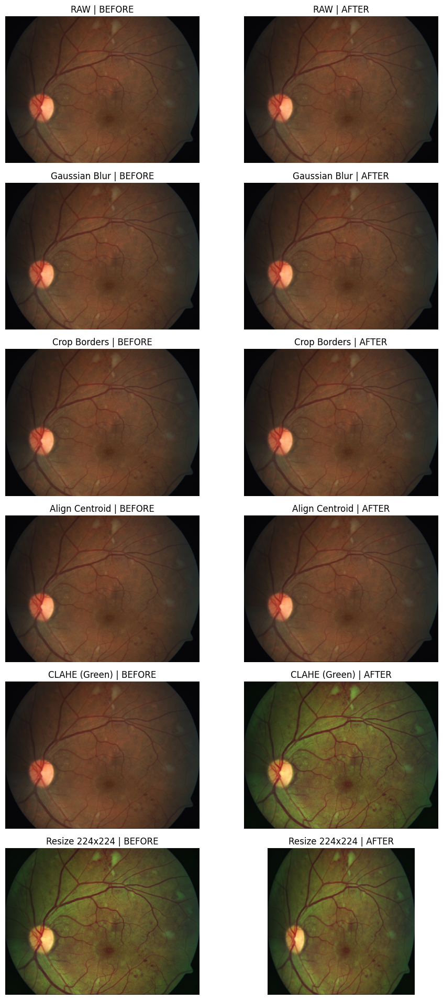

Final shape (computed): (224, 224, 3) | dtype: uint8
Final shape (on disk): (224, 224, 3) | dtype: uint8


In [ ]:
# ==========================
# DEMO 2: 1 görüntü için preprocessing adım adım (önce/sonra)
# ==========================
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2

SEED = 42
USE_SPLIT = "val"

if USE_SPLIT == "val":
    df_src = df_val.copy()
    SRC_DIR  = VAL_DIR
    PREP_DIR = PREP_VAL_DIR
else:
    df_src = df_train.copy()
    SRC_DIR  = TRAIN_DIR
    PREP_DIR = PREP_TRAIN_DIR

df_src["diagnosis"] = df_src["diagnosis"].astype(str)

# select 1 from Preprocessed
def exists_in_prep(fname):
    return os.path.exists(os.path.join(PREP_DIR, fname))

df_src2 = df_src[df_src["id_code"].apply(exists_in_prep)].reset_index(drop=True)
assert len(df_src2) > 0, "PREP_DIR içinde dosya yok."

rng = np.random.default_rng(SEED)
row = df_src2.iloc[int(rng.integers(0, len(df_src2)))]
fname = row["id_code"]
label = row.get("diagnosis", "?")

raw_path  = os.path.join(SRC_DIR,  fname)
prep_path = os.path.join(PREP_DIR, fname)

print("✅ Seçilen dosya:", fname, "| class:", label)
print("RAW :", raw_path)
print("PREP:", prep_path)

# ---------- preprocessing ----------
def crop_black_borders(img_bgr, tol=10):
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    mask = gray > tol
    if mask.sum() == 0:
        return img_bgr
    coords = np.argwhere(mask)
    y0, x0 = coords.min(axis=0)
    y1, x1 = coords.max(axis=0) + 1
    return img_bgr[y0:y1, x0:x1]

def align_by_centroid(img_bgr, tol=10):
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    mask = (gray > tol).astype(np.uint8)
    M = cv2.moments(mask)
    if M["m00"] == 0:
        return img_bgr
    cx = int(M["m10"]/M["m00"]); cy = int(M["m01"]/M["m00"])
    h, w = img_bgr.shape[:2]
    tx = (w//2) - cx; ty = (h//2) - cy
    mat = np.float32([[1,0,tx],[0,1,ty]])
    return cv2.warpAffine(img_bgr, mat, (w,h), flags=cv2.INTER_LINEAR,
                          borderMode=cv2.BORDER_CONSTANT, borderValue=(0,0,0))

def clahe_green(img_bgr, clip=2.0, grid=(8,8)):
    b,g,r = cv2.split(img_bgr)
    clahe = cv2.createCLAHE(clipLimit=clip, tileGridSize=grid)
    g2 = clahe.apply(g)
    return cv2.merge([b,g2,r])

def to_rgb(img_bgr):
    return cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

img0 = cv2.imread(raw_path)
assert img0 is not None, f"RAW okunamadı: {raw_path}"

# 1) Blur
img_blur = cv2.GaussianBlur(img0, (3,3), 0)

# 2) Crop black borders
img_crop = crop_black_borders(img_blur, tol=10)

# 3) Align
img_align = align_by_centroid(img_crop, tol=10)

# 4) CLAHE (green channel)
img_clahe = clahe_green(img_align, clip=2.0, grid=(8,8))

# 5) Resize
OUT_SIZE = (224, 224)
img_resize = cv2.resize(img_clahe, OUT_SIZE, interpolation=cv2.INTER_AREA)

img_final_disk = cv2.imread(prep_path)  # BGR

steps = [
    ("RAW",                img0,        img0),
    ("Gaussian Blur",      img0,        img_blur),
    ("Crop Borders",       img_blur,    img_crop),
    ("Align Centroid",     img_crop,    img_align),
    ("CLAHE (Green)",      img_align,   img_clahe),
    ("Resize 224x224",     img_clahe,   img_resize),
]

# ---------- BEFORE / AFTER ----------
rows = len(steps)
fig, axes = plt.subplots(rows, 2, figsize=(10, 3.2*rows))

for i, (title, before_bgr, after_bgr) in enumerate(steps):
    ax1, ax2 = axes[i, 0], axes[i, 1]
    ax1.imshow(to_rgb(before_bgr))
    ax1.set_title(f"{title} | BEFORE")
    ax1.axis("off")

    ax2.imshow(to_rgb(after_bgr))
    ax2.set_title(f"{title} | AFTER")
    ax2.axis("off")

plt.tight_layout()
plt.show()

print("Final shape (computed):", img_resize.shape, "| dtype:", img_resize.dtype)
if img_final_disk is not None:
    print("Final shape (on disk):", img_final_disk.shape, "| dtype:", img_final_disk.dtype)
else:
    print("PREP dosyası okunamadı (disk):", prep_path)



CLASS 0 için seçilen dosya: 02358b47ea89.png
RAW : /content/drive/MyDrive/Image Processing Project/val_images/val_images/02358b47ea89.png
PREP: /content/preprocessed_aptos/val_images/02358b47ea89.png


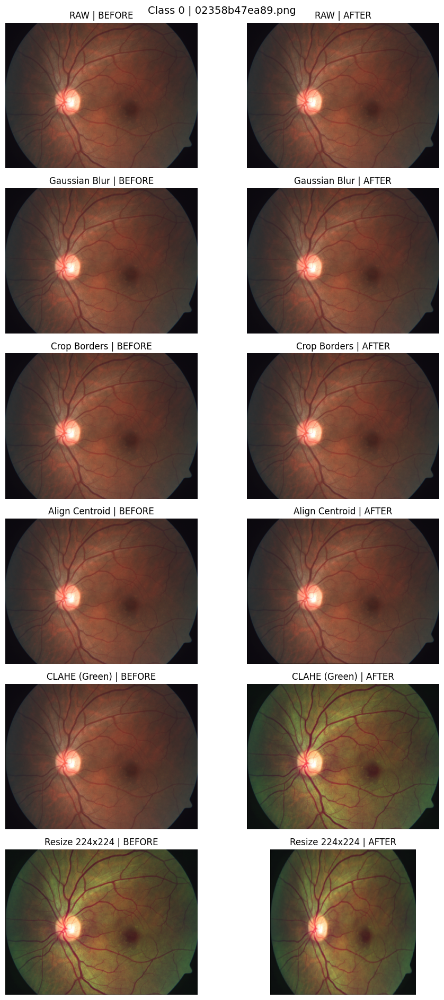

Final shape (computed): (224, 224, 3) | dtype: uint8
Final shape (on disk) : (224, 224, 3) | dtype: uint8

CLASS 1 için seçilen dosya: 12e3f5f2cb17.png
RAW : /content/drive/MyDrive/Image Processing Project/val_images/val_images/12e3f5f2cb17.png
PREP: /content/preprocessed_aptos/val_images/12e3f5f2cb17.png


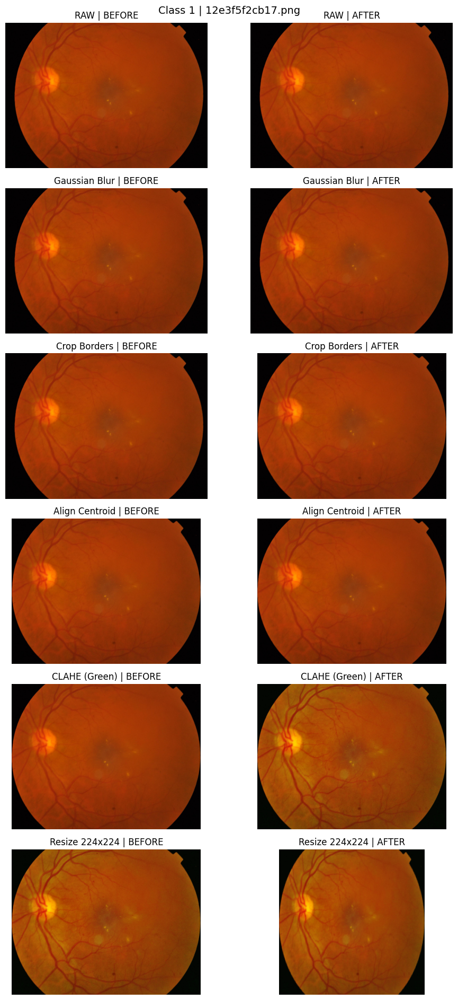

Final shape (computed): (224, 224, 3) | dtype: uint8
Final shape (on disk) : (224, 224, 3) | dtype: uint8

CLASS 2 için seçilen dosya: 12e6e66c80a7.png
RAW : /content/drive/MyDrive/Image Processing Project/val_images/val_images/12e6e66c80a7.png
PREP: /content/preprocessed_aptos/val_images/12e6e66c80a7.png


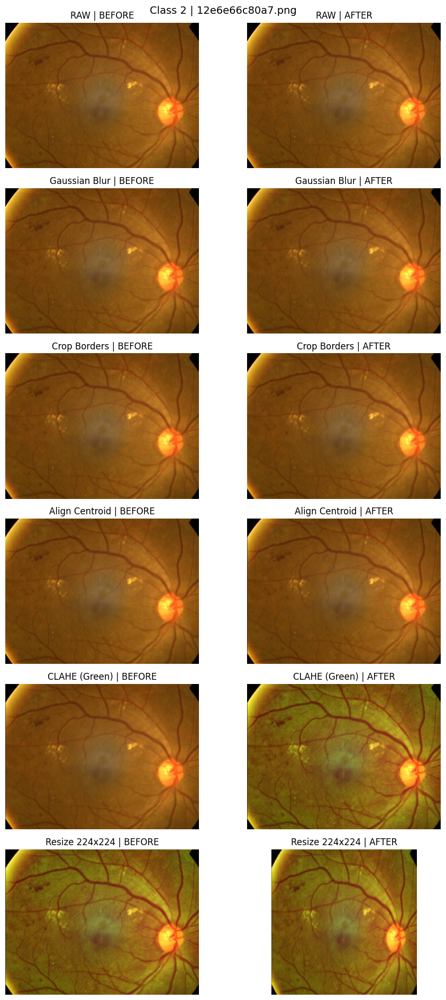

Final shape (computed): (224, 224, 3) | dtype: uint8
Final shape (on disk) : (224, 224, 3) | dtype: uint8

CLASS 3 için seçilen dosya: 0cb14014117d.png
RAW : /content/drive/MyDrive/Image Processing Project/val_images/val_images/0cb14014117d.png
PREP: /content/preprocessed_aptos/val_images/0cb14014117d.png


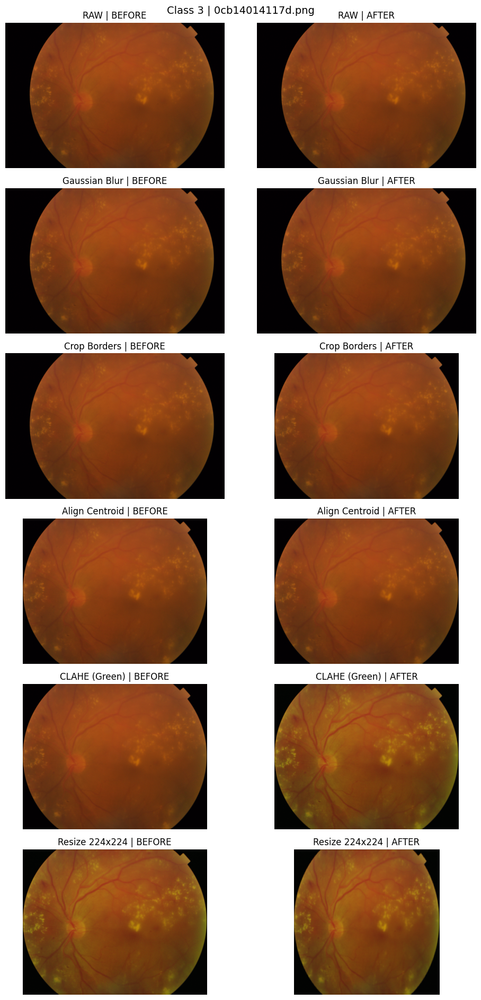

Final shape (computed): (224, 224, 3) | dtype: uint8
Final shape (on disk) : (224, 224, 3) | dtype: uint8

CLASS 4 için seçilen dosya: 0981195eb9fb.png
RAW : /content/drive/MyDrive/Image Processing Project/val_images/val_images/0981195eb9fb.png
PREP: /content/preprocessed_aptos/val_images/0981195eb9fb.png


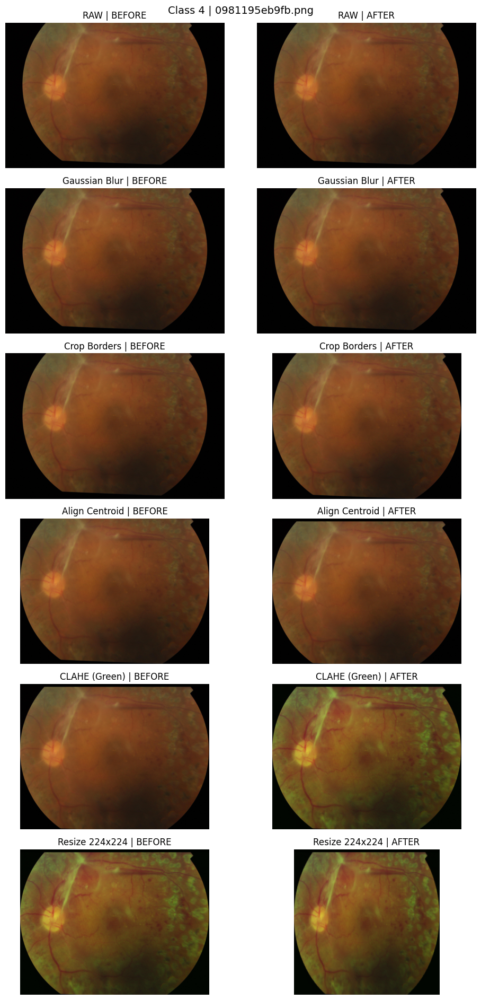

Final shape (computed): (224, 224, 3) | dtype: uint8
Final shape (on disk) : (224, 224, 3) | dtype: uint8


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2

SEED = 42
USE_SPLIT = "val"
CLASSES = ["0","1","2","3","4"]
OUT_SIZE = (224, 224)


if USE_SPLIT == "val":
    df_src = df_val.copy()
    SRC_DIR  = VAL_DIR
    PREP_DIR = PREP_VAL_DIR
else:
    df_src = df_train.copy()
    SRC_DIR  = TRAIN_DIR
    PREP_DIR = PREP_TRAIN_DIR

df_src["diagnosis"] = df_src["diagnosis"].astype(str)

def exists_in_prep(fname):
    return os.path.exists(os.path.join(PREP_DIR, str(fname)))

df_src = df_src[df_src["id_code"].apply(exists_in_prep)].reset_index(drop=True)
assert len(df_src) > 0, f"PREP_DIR içinde dosya yok gibi: {PREP_DIR}"

rng = np.random.default_rng(SEED)

# ---------- preprocessing
def crop_black_borders(img_bgr, tol=10):
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    mask = gray > tol
    if mask.sum() == 0:
        return img_bgr
    coords = np.argwhere(mask)
    y0, x0 = coords.min(axis=0)
    y1, x1 = coords.max(axis=0) + 1
    return img_bgr[y0:y1, x0:x1]

def align_by_centroid(img_bgr, tol=10):
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    mask = (gray > tol).astype(np.uint8)
    M = cv2.moments(mask)
    if M["m00"] == 0:
        return img_bgr
    cx = int(M["m10"]/M["m00"]); cy = int(M["m01"]/M["m00"])
    h, w = img_bgr.shape[:2]
    tx = (w//2) - cx; ty = (h//2) - cy
    mat = np.float32([[1,0,tx],[0,1,ty]])
    return cv2.warpAffine(
        img_bgr, mat, (w,h),
        flags=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_CONSTANT,
        borderValue=(0,0,0)
    )

def clahe_green(img_bgr, clip=2.0, grid=(8,8)):
    b,g,r = cv2.split(img_bgr)
    clahe = cv2.createCLAHE(clipLimit=clip, tileGridSize=grid)
    g2 = clahe.apply(g)
    return cv2.merge([b,g2,r])

def to_rgb(img_bgr):
    return cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# ---------- select 1 from each class ----------
for c in CLASSES:
    dfc = df_src[df_src["diagnosis"] == c].reset_index(drop=True)
    if len(dfc) == 0:
        print(f"Class {c} için örnek bulunamadı (PREP_DIR filtresinden dolayı olabilir).")
        continue

    row = dfc.iloc[int(rng.integers(0, len(dfc)))]
    fname = str(row["id_code"])
    raw_path  = os.path.join(SRC_DIR, fname)
    prep_path = os.path.join(PREP_DIR, fname)

    print("\n====================")
    print(f"CLASS {c} için seçilen dosya: {fname}")
    print("RAW :", raw_path)
    print("PREP:", prep_path)
    print("====================")

    img0 = cv2.imread(raw_path)
    if img0 is None:
        print(f"RAW okunamadı, atlıyorum: {raw_path}")
        continue

    # 1) Blur
    img_blur = cv2.GaussianBlur(img0, (3,3), 0)
    # 2) Crop borders
    img_crop = crop_black_borders(img_blur, tol=10)
    # 3) Align
    img_align = align_by_centroid(img_crop, tol=10)
    # 4) CLAHE
    img_clahe = clahe_green(img_align, clip=2.0, grid=(8,8))
    # 5) Resize
    img_resize = cv2.resize(img_clahe, OUT_SIZE, interpolation=cv2.INTER_AREA)

    img_final_disk = cv2.imread(prep_path)  # BGR

    steps = [
        ("RAW",              img0,       img0),
        ("Gaussian Blur",    img0,       img_blur),
        ("Crop Borders",     img_blur,   img_crop),
        ("Align Centroid",   img_crop,   img_align),
        ("CLAHE (Green)",    img_align,  img_clahe),
        ("Resize 224x224",   img_clahe,  img_resize),
    ]

    rows = len(steps)
    fig, axes = plt.subplots(rows, 2, figsize=(10, 3.2*rows))
    fig.suptitle(f"Class {c} | {fname}", fontsize=14)

    for i, (title, before_bgr, after_bgr) in enumerate(steps):
        ax1, ax2 = axes[i, 0], axes[i, 1]
        ax1.imshow(to_rgb(before_bgr)); ax1.axis("off"); ax1.set_title(f"{title} | BEFORE")
        ax2.imshow(to_rgb(after_bgr));  ax2.axis("off"); ax2.set_title(f"{title} | AFTER")

    plt.tight_layout()
    plt.show()

    print("Final shape (computed):", img_resize.shape, "| dtype:", img_resize.dtype)
    if img_final_disk is not None:
        print("Final shape (on disk) :", img_final_disk.shape, "| dtype:", img_final_disk.dtype)
    else:
        print("PREP dosyası okunamadı (disk):", prep_path)
